In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
from os import listdir
from PIL import Image
import glob
import os.path
import pandas as pd
import numpy as np
import skimage.io as io
import skimage as sk
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
import matplotlib
import xgboost
from skimage.filters import threshold_otsu
from skimage.morphology import square
from sklearn.metrics import jaccard_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score, jaccard_score, matthews_corrcoef, f1_score
from skimage.feature import hog
import cv2
import xgboost
from scipy.ndimage import generic_filter



# Importación de las imágenes

In [3]:
# Rutas de los directorios
carpeta_sat = 'DataSet_1/roads/sat'
carpeta_gt = 'DataSet_1/roads/gt'

# Obtenemos las mágenes de satélite:
imgs_sat = []
for f in os.listdir(carpeta_sat):
    img = Image.open(os.path.join(carpeta_sat, f))
    img_np = np.array(img)
    imgs_sat.append(img_np)
    
# Obtenemos las imágenes de salida:    
imgs_gt = []
for f in os.listdir(carpeta_gt):
    img = Image.open(os.path.join(carpeta_gt, f))
    img_np = np.array(img) > 0
    imgs_gt.append(img_np)

Creación de funciones que se usarán más adelante

In [4]:
def calcular_gradiente(imagen, sigma):
    der_horizontal, der_vertical = calcular_derivadas(imagen, sigma)
    return [der_horizontal, der_vertical]

def calcular_derivadas(imagen, sigma):
    der_horizontal = ndi.gaussian_filter(imagen, sigma=sigma, order=[1,0])
    der_vertical = ndi.gaussian_filter(imagen, sigma=sigma, order=[0,1])
    return der_horizontal, der_vertical

def calcular_magnitud(gradiente):
    dx, dy = gradiente
    mg = np.sqrt(dx**2 + dy**2)
    return mg

def calcular_orientacion(gradiente):
    dx, dy = gradiente
    orientacion = np.arctan2(dy, dx)
    return orientacion

def calcular_laplaciano(imagen, sigma):
    dx2 = ndi.gaussian_filter(imagen, sigma=sigma, order=[2,0])
    dy2 = ndi.gaussian_filter(imagen, sigma=sigma, order=[0,2])
    laplaciano = dx2 + dy2
    
    return laplaciano

La erosión es una técnica de post-procesado utilizada en procesamiento de imágenes que elimina píxeles en los bordes de los objetos en una imagen binaria.

In [5]:


def aplicar_erosion(images, kernel_size=3):
  
    # Aplicar erosión a cada imagen
    eroded_images = [sk.morphology.erosion(img, square(kernel_size)) for img in images]

    # Crear DataFrame para almacenar los resultados aplanados
    flattened_df = pd.DataFrame({'Er': [pixel for img in eroded_images for pixel in img.flatten()]})

    # Devolver los valores como un arreglo
    return flattened_df['Er'].values





Usaremos este código para calcular características vecinales promedio en cada canal de una imagen, lo que permite extraer información contextual para tareas de análisis o procesamiento.

In [6]:
from scipy.ndimage import generic_filter

# Función para calcular características vecinales
def extraer_vecindario(img, tamaño_ventana=3):
    # Promedio de vecindario
    def vecindario_promedio(values):
        return np.mean(values)
    
    # Calculamos la media de los valores en la ventana para cada canal
    vecindario_r = generic_filter(img[:, :, 0], vecindario_promedio, size=tamaño_ventana)
    vecindario_g = generic_filter(img[:, :, 1], vecindario_promedio, size=tamaño_ventana)
    vecindario_b = generic_filter(img[:, :, 2], vecindario_promedio, size=tamaño_ventana)
    
    return vecindario_r, vecindario_g, vecindario_b


# Canales RGB


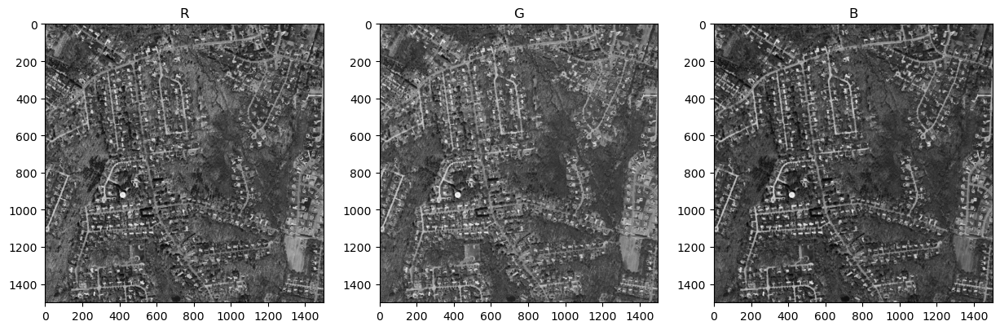

In [7]:
road_ejemplo = imgs_sat[11]

plt.rcParams["figure.figsize"] = [15, 15]

plt.subplot(131, title='R')
plt.imshow(road_ejemplo[:,:,0], cmap='gray')
plt.subplot(132, title='G')
plt.imshow(road_ejemplo[:,:,1], cmap='gray')
plt.subplot(133, title='B')
plt.imshow(road_ejemplo[:,:,2], cmap='gray')

En esta practica se nos presenta un total de 40 imágenes 20 satélitales y 20 binarias, que son las salidas deseadas. Lo primero que hemos de hacer es dividir los datos en tres conjuntos: Entrenamiento, validación y test. Para ello las imágenes se organizaran de la siguiente manera:

- Entrenamiento: 14 imágenes
- Validación: 3 imágenes
- Test: 3 imágenes


Este código procesa imágenes satelitales dividiéndolas en características RGB y sus vecindarios promedio en ventanas 3x3. Primero extrae las características RGB de cada imagen, luego calcula el promedio de los píxeles dentro de un vecindario de 3x3 y organiza todo en un DataFrame. Se divide en tres conjuntos: entrenamiento, validación y prueba. Cada conjunto tiene características (X_train, X_val, X_test) y etiquetas (y_train, y_val, y_test).


In [8]:
import numpy as np
import pandas as pd

# Extraer características RGB para un subconjunto de datos
X_train = pd.DataFrame()
tamaño_ventana = 3  # Tamaño del vecindario

for i in range(14):
    # Extraer valores RGB originales
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    # Extraer vecindarios
    pad = tamaño_ventana // 2
    img_padded = np.pad(imgs_sat[i], ((pad, pad), (pad, pad), (0, 0)), mode='reflect')
    vecinos = np.zeros_like(imgs_sat[i])

    for x in range(pad, imgs_sat[i].shape[0] + pad):
        for y in range(pad, imgs_sat[i].shape[1] + pad):
            region = img_padded[x - pad:x + pad + 1, y - pad:y + pad + 1, :]
            vecinos[x - pad, y - pad, :] = np.mean(region, axis=(0, 1))

    vec_r = vecinos[:, :, 0].flatten()
    vec_g = vecinos[:, :, 1].flatten()
    vec_b = vecinos[:, :, 2].flatten()

    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["Vec_R"] = vec_r  # Vecindario promedio R
    df_img["Vec_G"] = vec_g  # Vecindario promedio G
    df_img["Vec_B"] = vec_b  # Vecindario promedio B

    X_train = pd.concat([X_train, df_img])

# Procesar las etiquetas
y_train = list()
for i in range(14):
    img = imgs_gt[i].flatten()
    y_train.append(img)

y_train = [item for sublist in y_train for item in sublist]
y_train = np.array(y_train)

print(f"Shape de X_train: {X_train.shape}")
print(f"Shape de y_train: {len(y_train)}")

X_val = pd.DataFrame()
tamaño_ventana = 3  # Tamaño del vecindario

for i in range(14, 17):
    # Extraer valores RGB originales
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    # Extraer vecindarios
    pad = tamaño_ventana // 2
    img_padded = np.pad(imgs_sat[i], ((pad, pad), (pad, pad), (0, 0)), mode='reflect')
    vecinos = np.zeros_like(imgs_sat[i])

    for x in range(pad, imgs_sat[i].shape[0] + pad):
        for y in range(pad, imgs_sat[i].shape[1] + pad):
            region = img_padded[x - pad:x + pad + 1, y - pad:y + pad + 1, :]
            vecinos[x - pad, y - pad, :] = np.mean(region, axis=(0, 1))

    vec_r = vecinos[:, :, 0].flatten()
    vec_g = vecinos[:, :, 1].flatten()
    vec_b = vecinos[:, :, 2].flatten()

    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["Vec_R"] = vec_r  # Vecindario promedio R
    df_img["Vec_G"] = vec_g  # Vecindario promedio G
    df_img["Vec_B"] = vec_b  # Vecindario promedio B

    X_val = pd.concat([X_val, df_img])

# Procesar las etiquetas
y_val = list()
for i in range(14, 17):
    img = imgs_gt[i].flatten()
    y_val.append(img)

y_val = [item for sublist in y_val for item in sublist]
y_val = np.array(y_val)

print(f"Shape de X_val: {X_val.shape}")
print(f"Shape de y_val: {len(y_val)}")

X_test = pd.DataFrame()
tamaño_ventana = 3  # Tamaño del vecindario

for i in range(17, 20):
    # Extraer valores RGB originales
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    # Extraer vecindarios
    pad = tamaño_ventana // 2
    img_padded = np.pad(imgs_sat[i], ((pad, pad), (pad, pad), (0, 0)), mode='reflect')
    vecinos = np.zeros_like(imgs_sat[i])

    for x in range(pad, imgs_sat[i].shape[0] + pad):
        for y in range(pad, imgs_sat[i].shape[1] + pad):
            region = img_padded[x - pad:x + pad + 1, y - pad:y + pad + 1, :]
            vecinos[x - pad, y - pad, :] = np.mean(region, axis=(0, 1))

    vec_r = vecinos[:, :, 0].flatten()
    vec_g = vecinos[:, :, 1].flatten()
    vec_b = vecinos[:, :, 2].flatten()

    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["Vec_R"] = vec_r  # Vecindario promedio R
    df_img["Vec_G"] = vec_g  # Vecindario promedio G
    df_img["Vec_B"] = vec_b  # Vecindario promedio B

    X_test = pd.concat([X_test, df_img])

# Procesar las etiquetas
y_test = list()
for i in range(17, 20):
    img = imgs_gt[i].flatten()
    y_test.append(img)

y_test = [item for sublist in y_test for item in sublist]
y_test = np.array(y_test)

print(f"Shape de X_test: {X_test.shape}")
print(f"Shape de y_test: {len(y_test)}")


Shape de X_train: (31500000, 6)
Shape de y_train: 31500000
Shape de X_val: (6750000, 6)
Shape de y_val: 6750000
Shape de X_test: (6750000, 6)
Shape de y_test: 6750000


Este código convierte las etiquetas y_train, y_val, y y_test en valores binarios (True o False), donde True representa valores mayores a 0. Luego, calcula la relación entre los valores falsos y verdaderos en el conjunto de entrenamiento. Finalmente, crea matrices de datos (DMatrix) para XGBoost, que son utilizadas para el entrenamiento (dtrain), validación (dval), y prueba (dtest) del modelo.

In [9]:
bin_y_train = y_train > 0
bin_y_val = y_val > 0
bin_y_test = y_test > 0

num_trues_train = sum(bin_y_train)
num_false_train = len(bin_y_train) - num_trues_train
ratio = int(num_false_train / num_trues_train)
print(f'ratio=',ratio)

dtrain = xgboost.DMatrix(X_train.values, label=bin_y_train)
dval = xgboost.DMatrix(X_val.values, label=bin_y_val)
dtest = xgboost.DMatrix(X_test.values) 


ratio= 30


In [10]:
param = {'max_depth':8, 'eta':1, 'objective':'binary:logistic', 'scale_pos_weight':ratio}
watchlist = [(dtrain, 'train'), (dval, 'val')]

In [11]:
model = xgboost.train(param, dtrain, 100, watchlist, early_stopping_rounds=10)

c:\Users\pdcob\anaconda3\Lib\site-packages\xgboost\core.py:723: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)


[0]	train-logloss:0.38163	val-logloss:0.39321
[1]	train-logloss:0.34609	val-logloss:0.37148
[2]	train-logloss:0.34149	val-logloss:0.37260
[3]	train-logloss:0.33874	val-logloss:0.37200
[4]	train-logloss:0.33765	val-logloss:0.37261
[5]	train-logloss:0.33722	val-logloss:0.37291
[6]	train-logloss:0.33369	val-logloss:0.37067
[7]	train-logloss:0.33339	val-logloss:0.36899
[8]	train-logloss:0.33326	val-logloss:0.36869
[9]	train-logloss:0.33305	val-logloss:0.37286
[10]	train-logloss:0.33648	val-logloss:0.36771
[11]	train-logloss:0.33792	val-logloss:0.37091
[12]	train-logloss:0.33609	val-logloss:0.36752
[13]	train-logloss:0.33587	val-logloss:0.36719
[14]	train-logloss:0.33532	val-logloss:0.37580
[15]	train-logloss:0.33455	val-logloss:0.36656
[16]	train-logloss:0.33468	val-logloss:0.36629
[17]	train-logloss:0.33395	val-logloss:0.36681
[18]	train-logloss:0.33336	val-logloss:0.36652
[19]	train-logloss:0.33659	val-logloss:0.36951
[20]	train-logloss:0.33257	val-logloss:0.36612
[21]	train-logloss:0.33

In [12]:
y_pred = model.predict(dtest)
y_pred_prueba = y_pred > 0.5

In [13]:
img1 = y_pred_prueba[0*(1500*1500) : 1*(1500*1500)]
img2 = y_pred_prueba[1*(1500*1500) : 2*(1500*1500)]
img3 = y_pred_prueba[2*(1500*1500) : 3*(1500*1500)]


Img1: 2250000
Img2: 2250000
Img3: 2250000


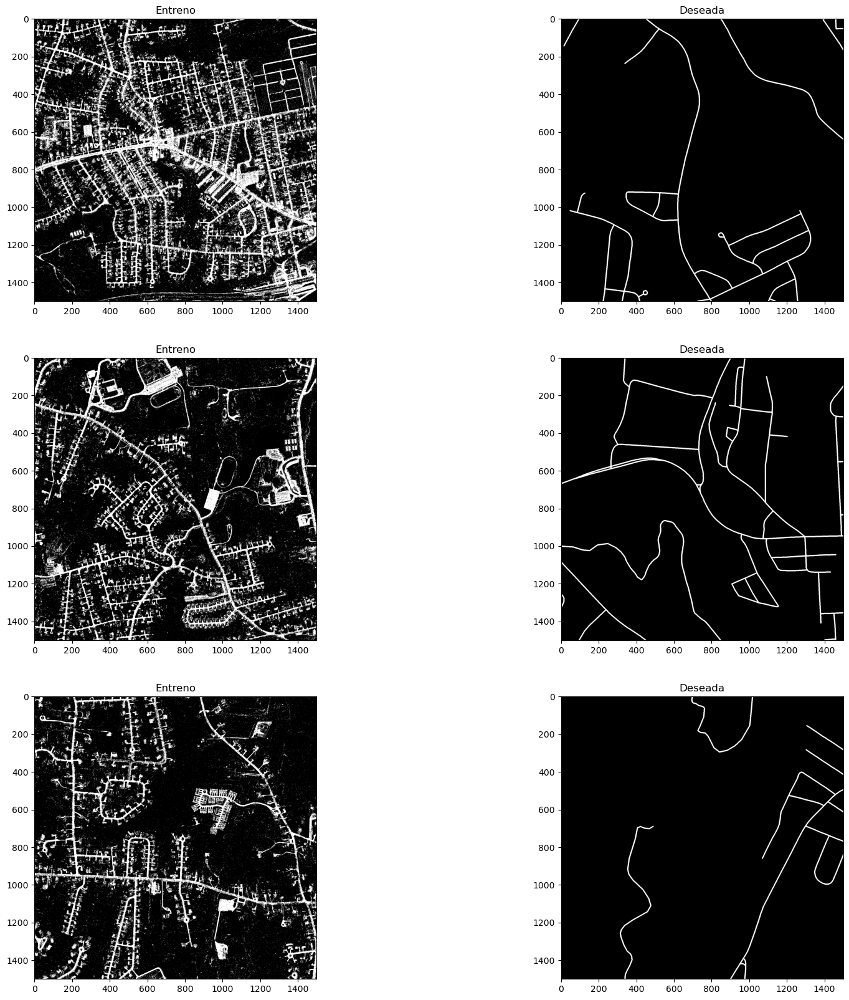

In [62]:
img1_r = np.reshape(img1, (1500, 1500))
img2_r = np.reshape(img2, (1500, 1500))
img3_r = np.reshape(img3, (1500, 1500))

plt.rcParams["figure.figsize"] = [20, 20]

plt.subplot(321, title='Entreno')
plt.imshow(img1_r, cmap='gray')
plt.subplot(322, title='Deseada')
plt.imshow(imgs_gt[3], cmap='gray')
plt.subplot(323, title='Entreno')
plt.imshow(img2_r, cmap='gray')
plt.subplot(324, title='Deseada')
plt.imshow(imgs_gt[4], cmap='gray')
plt.subplot(325, title='Entreno')
plt.imshow(img3_r, cmap='gray')
plt.subplot(326, title='Deseada')
plt.imshow(imgs_gt[5], cmap='gray')

Aplicamos una operación de erosión a las imágenes predichas usando un núcleo de tamaño 3x3. Luego, reconstruimos las imágenes erosionadas y las mostramos junto con las imágenes originales y deseadas en un gráfico de 3x3 subgráficas, donde se compara la salida del clasificador, la imagen erosionada y la imagen deseada. Finalmente, ajustamos el layout para una visualización clara.

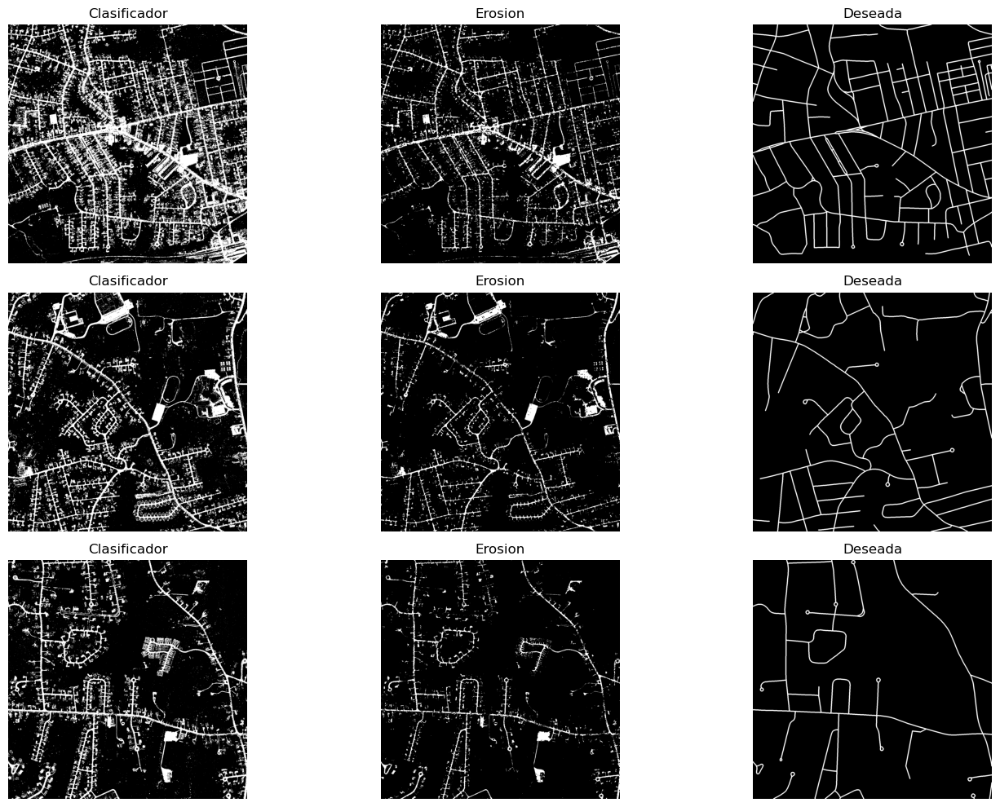

In [15]:
imagenes = [img1_r, img2_r, img3_r]
y_pred_erosiones = aplicar_erosion(imagenes, kernel_size=3)



# Reconstruir las imágenes erosionadas a partir de los valores aplanados
erosionadas = [y_pred_erosiones[i * img.size:(i + 1) * img.size].reshape(img.shape) for i, img in enumerate(imagenes)]

# Crear el plot
plt.figure(figsize=(15, 10))

# Imagen 1
plt.subplot(331, title='Clasificador')
plt.imshow(img1_r, cmap='gray')
plt.axis('off')

plt.subplot(332, title='Erosion')
plt.imshow(erosionadas[0], cmap='gray')
plt.axis('off')

plt.subplot(333, title='Deseada')
plt.imshow(imgs_gt[17], cmap='gray')
plt.axis('off')

# Imagen 2
plt.subplot(334, title='Clasificador')
plt.imshow(img2_r, cmap='gray')
plt.axis('off')

plt.subplot(335, title='Erosion')
plt.imshow(erosionadas[1], cmap='gray')
plt.axis('off')

plt.subplot(336, title='Deseada')
plt.imshow(imgs_gt[18], cmap='gray')
plt.axis('off')

# Imagen 3
plt.subplot(337, title='Clasificador')
plt.imshow(img3_r, cmap='gray')
plt.axis('off')

plt.subplot(338, title='Erosion')
plt.imshow(erosionadas[2], cmap='gray')
plt.axis('off')

plt.subplot(339, title='Deseada')
plt.imshow(imgs_gt[19], cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


Calculamos las siguientes métricas

### Accuracy:
Mide el porcentaje de predicciones correctas (comparando las predicciones con las etiquetas reales).

### F1-Score:
Calcula la media armónica entre precisión y recall, balanceando falsos positivos y negativos.

### Jaccard:
Mide la similitud entre las predicciones y las etiquetas reales, comparando la intersección sobre la unión.

### MCC (Matthews Correlation Coefficient):
Evalúa la calidad de las predicciones considerando todos los posibles resultados (TP, TN, FP, FN), especialmente útil en clases desbalanceadas.


In [50]:
### Accuracy:
accuracy1 = accuracy_score(bin_y_test, y_pred_prueba)
print(f"Erosion Accuracy Test: {accuracy1:.3f}")

### F1-Score:
f1a = f1_score(bin_y_test, y_pred_prueba)
print(f"Erosion F1 Score: {f1a:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_prueba)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_prueba)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.842
Erosion F1 Score: 0.376
Erosion Jaccard Test: 0.231
MCC: 0.397


In [51]:
### Accuracy:
accuracy1e = accuracy_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Accuracy Test: {accuracy1e:.3f}")

### F1-Score:
f1ae = f1_score(bin_y_test, y_pred_erosiones)
print(f"Erosion F1 Score: {f1ae:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_erosiones)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.938
Erosion F1 Score: 0.502
Erosion Jaccard Test: 0.335
MCC: 0.471


# HSV,BN,Gradientes

En esta prueba añadiremos los gradientes X e Y, el espacio de color HSV y la imágen BN


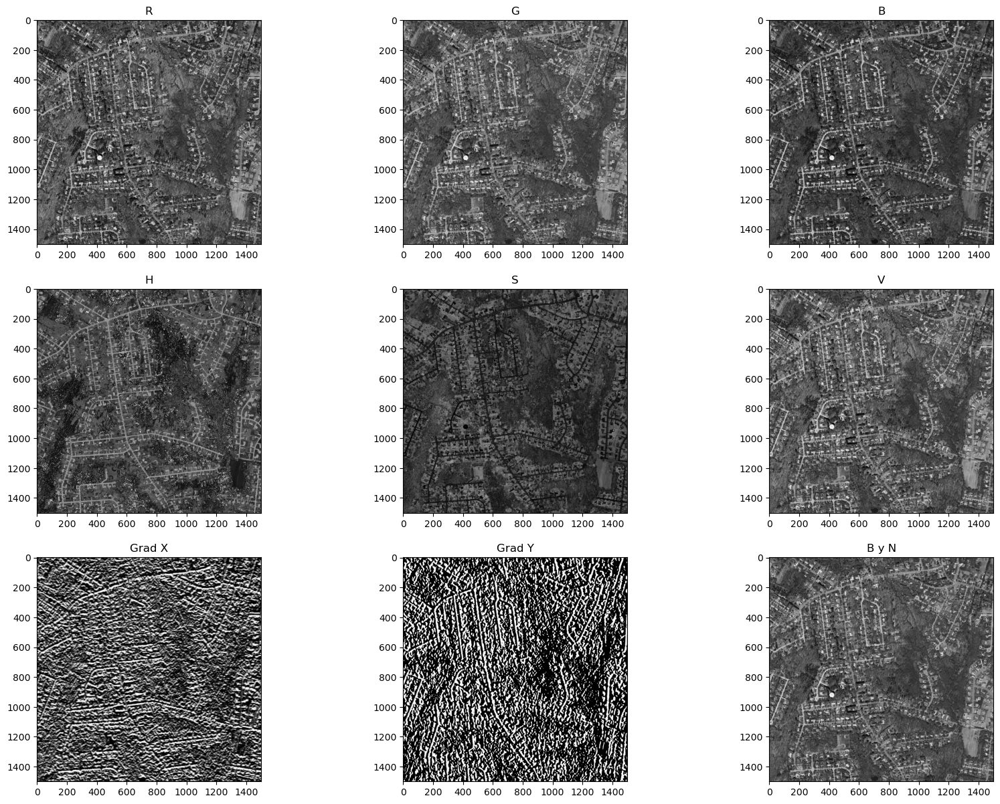

In [18]:
road_ejemplo = imgs_sat[11]
gradiente_road = calcular_gradiente(road_ejemplo[:,:,2], 3)
road_hsv = sk.color.rgb2hsv(road_ejemplo)
road_bn = sk.color.rgb2gray(road_ejemplo)

plt.subplot(4,3,1, title='R')
plt.imshow(road_ejemplo[:,:,0], cmap='gray')
plt.subplot(4,3,2, title='G')
plt.imshow(road_ejemplo[:,:,1], cmap='gray')
plt.subplot(4,3,3, title='B')
plt.imshow(road_ejemplo[:,:,2], cmap='gray')

plt.subplot(4,3,4, title='H')
plt.imshow(road_hsv[:,:,0], cmap='gray')
plt.subplot(4,3,5, title='S')
plt.imshow(road_hsv[:,:,1], cmap='gray')
plt.subplot(4,3,6, title='V')
plt.imshow(road_hsv[:,:,2], cmap='gray')

plt.subplot(4,3,7, title='Grad X')
plt.imshow(gradiente_road[0], cmap='gray')
plt.subplot(4,3,8, title='Grad Y')
plt.imshow(gradiente_road[1], cmap='gray')
plt.subplot(4,3,9, title='B y N')
plt.imshow(road_bn, cmap='gray')

In [19]:
X_train = pd.DataFrame()
tamaño_ventana = 3  # Tamaño del vecindario

for i in range(14):
    # Extraer valores RGB originales
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    # Convertir a HSV
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()

    # Convertir a escala de grises
    road_bn = sk.color.rgb2gray(imgs_sat[i])

    # Gradiente
    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], tamaño_ventana)

    # Extraer vecindarios
    vec_r, vec_g, vec_b = extraer_vecindario(imgs_sat[i], tamaño_ventana)

    # Aplanar vecindarios
    vec_r_flat = vec_r.flatten()
    vec_g_flat = vec_g.flatten()
    vec_b_flat = vec_b.flatten()

    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["Vec_R"] = vec_r_flat  # Vecindario promedio R
    df_img["Vec_G"] = vec_g_flat  # Vecindario promedio G
    df_img["Vec_B"] = vec_b_flat  # Vecindario promedio B
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["BN"] = road_bn.flatten()
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()

    X_train = pd.concat([X_train, df_img])

# Procesar las etiquetas
y_train = list()
for i in range(14):
    img = imgs_gt[i].flatten()
    y_train.append(img)

y_train = [item for sublist in y_train for item in sublist]
y_train = np.array(y_train)

print(f"Shape de X_train: {X_train.shape}")
print(f"Shape de y_train: {len(y_train)}")


X_val = pd.DataFrame()
tamaño_ventana = 3  # Tamaño del vecindario

for i in range(14, 17):
    # Extraer valores RGB originales
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    # Convertir a HSV
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()

    # Convertir a escala de grises
    road_bn = sk.color.rgb2gray(imgs_sat[i])

    # Gradiente
    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], tamaño_ventana)

    # Extraer vecindarios
    vec_r, vec_g, vec_b = extraer_vecindario(imgs_sat[i], tamaño_ventana)

    # Aplanar vecindarios
    vec_r_flat = vec_r.flatten()
    vec_g_flat = vec_g.flatten()
    vec_b_flat = vec_b.flatten()

    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["Vec_R"] = vec_r_flat  # Vecindario promedio R
    df_img["Vec_G"] = vec_g_flat  # Vecindario promedio G
    df_img["Vec_B"] = vec_b_flat  # Vecindario promedio B
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["BN"] = road_bn.flatten()
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()

    X_val = pd.concat([X_val, df_img])

# Procesar las etiquetas
y_val = list()
for i in range(14, 17):
    img = imgs_gt[i].flatten()
    y_val.append(img)

y_val = [item for sublist in y_val for item in sublist]
y_val = np.array(y_val)

print(f"Shape de X_val: {X_val.shape}")
print(f"Shape de y_val: {len(y_val)}")

X_test = pd.DataFrame()
tamaño_ventana = 3  # Tamaño del vecindario

for i in range(17, 20):
    # Extraer valores RGB originales
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    # Convertir a HSV
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()

    # Convertir a escala de grises
    road_bn = sk.color.rgb2gray(imgs_sat[i])

    # Gradiente
    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], 3)

    # Extraer vecindarios (media como ejemplo)
    vec_r, vec_g, vec_b = extraer_vecindario(imgs_sat[i], tamaño_ventana)

    # Aplanar vecindarios
    vec_r_flat = vec_r.flatten()
    vec_g_flat = vec_g.flatten()
    vec_b_flat = vec_b.flatten()

    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["Vec_R"] = vec_r_flat  # Vecindario promedio R
    df_img["Vec_G"] = vec_g_flat  # Vecindario promedio G
    df_img["Vec_B"] = vec_b_flat  # Vecindario promedio B
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["BN"] = road_bn.flatten()
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()

    X_test = pd.concat([X_test, df_img])

# Resto del código permanece igual

y_test = list()
for i in range(17, 20):
    img = imgs_gt[i].flatten()
    y_test.append(img)

y_test = [item for sublist in y_test for item in sublist]
y_test = np.array(y_test)

print(f"Shape de X_test: {X_test.shape}")
print(f"Shape de X_test: {len(y_test)}")

Shape de X_train: (31500000, 12)
Shape de y_train: 31500000
Shape de X_val: (6750000, 12)
Shape de y_val: 6750000
Shape de X_test: (6750000, 12)
Shape de X_test: 6750000


In [20]:
bin_y_train = y_train > 0
bin_y_val = y_val > 0
bin_y_test = y_test > 0

num_trues_train = sum(bin_y_train)
num_false_train = len(bin_y_train) - num_trues_train
ratio = int(num_false_train / num_trues_train)
print(f'ratio=',ratio)

dtrain = xgboost.DMatrix(X_train.values, label=bin_y_train)
dval = xgboost.DMatrix(X_val.values, label=bin_y_val)
dtest = xgboost.DMatrix(X_test.values) 


ratio= 30


In [21]:
param = {'max_depth':8, 'eta':1, 'objective':'binary:logistic', 'scale_pos_weight':ratio}
watchlist = [(dtrain, 'train'), (dval, 'val')]

In [22]:
model = xgboost.train(param, dtrain, 100, watchlist, early_stopping_rounds=10)

c:\Users\pdcob\anaconda3\Lib\site-packages\xgboost\core.py:723: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)


[0]	train-logloss:0.37228	val-logloss:0.39420
[1]	train-logloss:0.34030	val-logloss:0.37014
[2]	train-logloss:0.33317	val-logloss:0.36762
[3]	train-logloss:0.33008	val-logloss:0.36384
[4]	train-logloss:0.32792	val-logloss:0.36324
[5]	train-logloss:0.32719	val-logloss:0.36237
[6]	train-logloss:0.32226	val-logloss:0.35959
[7]	train-logloss:0.32129	val-logloss:0.35957
[8]	train-logloss:0.32021	val-logloss:0.35968
[9]	train-logloss:0.31849	val-logloss:0.35775
[10]	train-logloss:0.32081	val-logloss:0.35896
[11]	train-logloss:0.31799	val-logloss:0.35762
[12]	train-logloss:0.32072	val-logloss:0.35922
[13]	train-logloss:0.31742	val-logloss:0.35809
[14]	train-logloss:0.31747	val-logloss:0.35604
[15]	train-logloss:0.31586	val-logloss:0.35580
[16]	train-logloss:0.31551	val-logloss:0.35564
[17]	train-logloss:0.31490	val-logloss:0.35545
[18]	train-logloss:0.31438	val-logloss:0.35482
[19]	train-logloss:0.31459	val-logloss:0.35548
[20]	train-logloss:0.31424	val-logloss:0.35565
[21]	train-logloss:0.31

In [23]:
y_pred = model.predict(dtest)
y_pred_prueba = y_pred > 0.5

Img1: 2250000
Img2: 2250000
Img3: 2250000


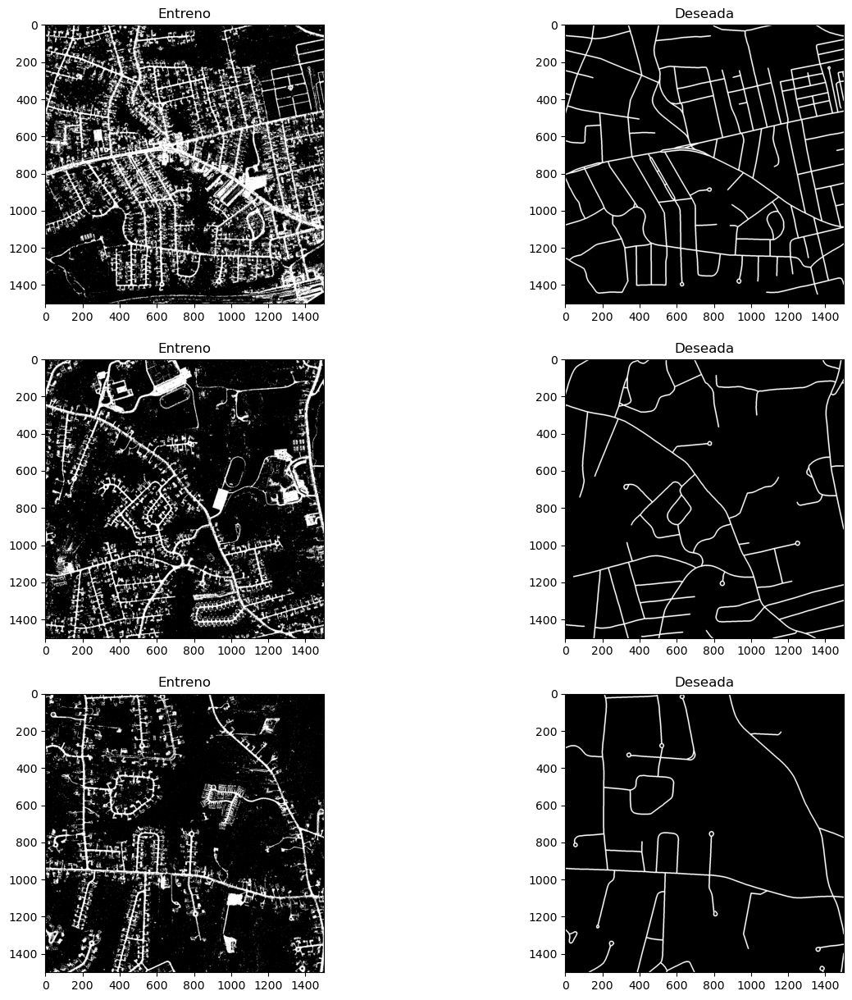

In [24]:
img1 = y_pred_prueba[0*(1500*1500) : 1*(1500*1500)]
img2 = y_pred_prueba[1*(1500*1500) : 2*(1500*1500)]
img3 = y_pred_prueba[2*(1500*1500) : 3*(1500*1500)]
print(f"Img1: {len(img1)}")
print(f"Img2: {len(img2)}")
print(f"Img3: {len(img3)}")


img1_r = np.reshape(img1, (1500, 1500))
img2_r = np.reshape(img2, (1500, 1500))
img3_r = np.reshape(img3, (1500, 1500))

plt.rcParams["figure.figsize"] = [15, 15]

plt.subplot(321, title='Entreno')
plt.imshow(img1_r, cmap='gray')
plt.subplot(322, title='Deseada')
plt.imshow(imgs_gt[17], cmap='gray')
plt.subplot(323, title='Entreno')
plt.imshow(img2_r, cmap='gray')
plt.subplot(324, title='Deseada')
plt.imshow(imgs_gt[18], cmap='gray')
plt.subplot(325, title='Entreno')
plt.imshow(img3_r, cmap='gray')
plt.subplot(326, title='Deseada')
plt.imshow(imgs_gt[19], cmap='gray')

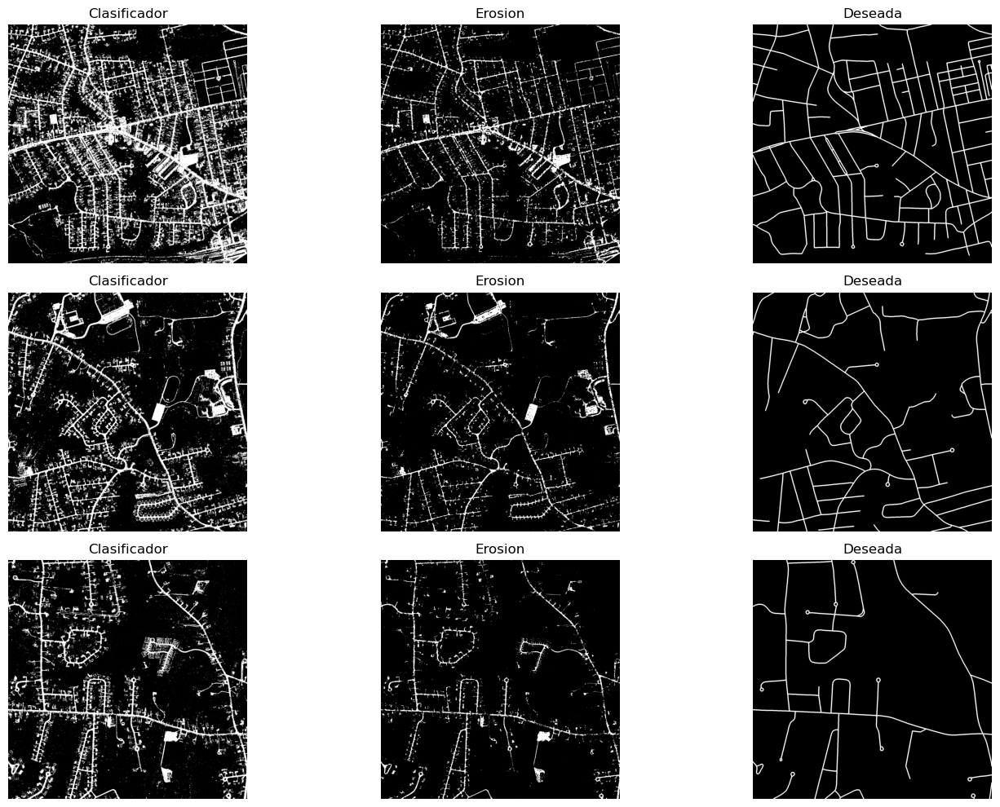

In [25]:
imagenes = [img1_r, img2_r, img3_r]
y_pred_erosiones = aplicar_erosion(imagenes, kernel_size=3)



# Reconstruir las imágenes erosionadas a partir de los valores aplanados
erosionadas = [y_pred_erosiones[i * img.size:(i + 1) * img.size].reshape(img.shape) for i, img in enumerate(imagenes)]

# Crear el plot
plt.figure(figsize=(15, 10))

# Imagen 1
plt.subplot(331, title='Clasificador')
plt.imshow(img1_r, cmap='gray')
plt.axis('off')

plt.subplot(332, title='Erosion')
plt.imshow(erosionadas[0], cmap='gray')
plt.axis('off')

plt.subplot(333, title='Deseada')
plt.imshow(imgs_gt[17], cmap='gray')
plt.axis('off')

# Imagen 2
plt.subplot(334, title='Clasificador')
plt.imshow(img2_r, cmap='gray')
plt.axis('off')

plt.subplot(335, title='Erosion')
plt.imshow(erosionadas[1], cmap='gray')
plt.axis('off')

plt.subplot(336, title='Deseada')
plt.imshow(imgs_gt[18], cmap='gray')
plt.axis('off')

# Imagen 3
plt.subplot(337, title='Clasificador')
plt.imshow(img3_r, cmap='gray')
plt.axis('off')

plt.subplot(338, title='Erosion')
plt.imshow(erosionadas[2], cmap='gray')
plt.axis('off')

plt.subplot(339, title='Deseada')
plt.imshow(imgs_gt[19], cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


In [52]:
### Accuracy:
accuracy2 = accuracy_score(bin_y_test, y_pred_prueba)
print(f"Erosion Accuracy Test: {accuracy2:.3f}")

### F1-Score:
f1b = f1_score(bin_y_test, y_pred_prueba)
print(f"Erosion F1 Score: {f1b:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_prueba)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_prueba)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.842
Erosion F1 Score: 0.376
Erosion Jaccard Test: 0.231
MCC: 0.397


In [53]:
### Accuracy:
accuracy2e = accuracy_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Accuracy Test: {accuracy2e:.3f}")

### F1-Score:
f1be = f1_score(bin_y_test, y_pred_erosiones)
print(f"Erosion F1 Score: {f1be:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_erosiones)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.938
Erosion F1 Score: 0.502
Erosion Jaccard Test: 0.335
MCC: 0.471


# Magnitud, Orientación, Laplaciano

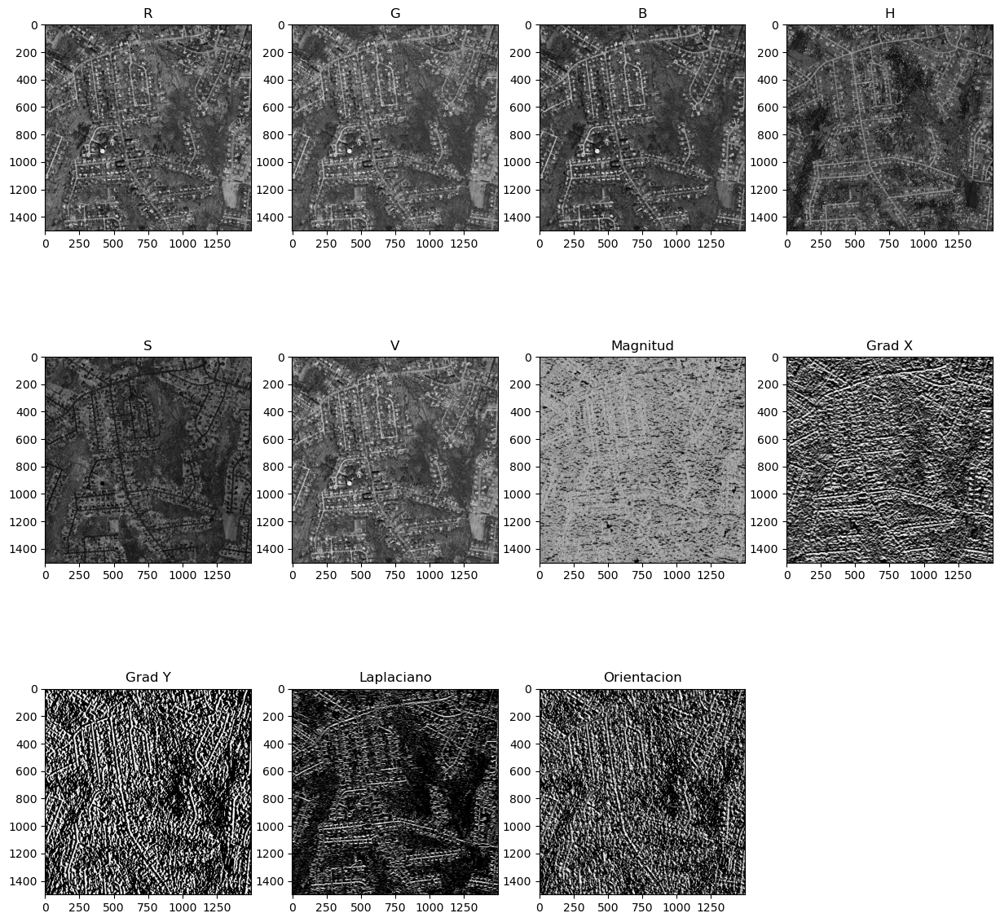

In [28]:
road_ejemplo = imgs_sat[11]
road_hsv = sk.color.rgb2hsv(road_ejemplo)
gradiente_road = calcular_gradiente(road_ejemplo[:,:,2], 3)
laplaciano_road = calcular_laplaciano(road_ejemplo[:,:,2], 3)
magnitud_road = calcular_magnitud(gradiente_road)
oritentacion_road = calcular_orientacion(gradiente_road)

plt.subplot(3,4,1, title='R')
plt.imshow(road_ejemplo[:,:,0], cmap='gray')
plt.subplot(3,4,2, title='G')
plt.imshow(road_ejemplo[:,:,1], cmap='gray')
plt.subplot(3,4,3, title='B')
plt.imshow(road_ejemplo[:,:,2], cmap='gray')

plt.subplot(3,4,4, title='H')
plt.imshow(road_hsv[:,:,0], cmap='gray')
plt.subplot(3,4,5, title='S')
plt.imshow(road_hsv[:,:,1], cmap='gray')
plt.subplot(3,4,6, title='V')
plt.imshow(road_hsv[:,:,2], cmap='gray')

plt.subplot(3,4,7, title='Magnitud')
plt.imshow(magnitud_road, cmap='gray')
plt.subplot(3,4,8, title='Grad X')
plt.imshow(gradiente_road[0], cmap='gray')
plt.subplot(3,4,9, title='Grad Y')
plt.imshow(gradiente_road[1], cmap='gray')
plt.subplot(3,4,10, title='Laplaciano')
plt.imshow(laplaciano_road, cmap='gray')
plt.subplot(3,4,11, title='Orientacion')
plt.imshow(oritentacion_road, cmap='gray')

In [29]:
X_train = pd.DataFrame()
for i in range(14):
    # Canales RGB
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    # Características vecinales
    vec_r, vec_g, vec_b = extraer_vecindario(imgs_sat[i], tamaño_ventana=3)

    # Gradientes, laplaciano y HSV
    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], 3)
    magnitud_road = calcular_magnitud(gradiente_road)
    oritentacion_road = calcular_orientacion(gradiente_road)
    laplaciano_road = calcular_laplaciano(imgs_sat[i][:, :, 2], 3)
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()

    # Construir DataFrame
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["R_Vec"] = vec_r.flatten()
    df_img["G_Vec"] = vec_g.flatten()
    df_img["B_Vec"] = vec_b.flatten()
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()
    df_img["Mag"] = magnitud_road.flatten()
    df_img["Ori"] = oritentacion_road.flatten()
    df_img["Lap"] = laplaciano_road.flatten()

    X_train = pd.concat([X_train, df_img])

y_train = [item for sublist in [imgs_gt[i].flatten() for i in range(14)] for item in sublist]
y_train = np.array(y_train)

print(f"Shape de X_train: {X_train.shape}")
print(f"Shape de y_train: {len(y_train)}")

# Validación
X_val = pd.DataFrame()
for i in range(14, 17):
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    vec_r, vec_g, vec_b = extraer_vecindario(imgs_sat[i], tamaño_ventana=3)

    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], 3)
    magnitud_road = calcular_magnitud(gradiente_road)
    oritentacion_road = calcular_orientacion(gradiente_road)
    laplaciano_road = calcular_laplaciano(imgs_sat[i][:, :, 2], 3)
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()

    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["R_Vec"] = vec_r.flatten()
    df_img["G_Vec"] = vec_g.flatten()
    df_img["B_Vec"] = vec_b.flatten()
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()
    df_img["Mag"] = magnitud_road.flatten()
    df_img["Ori"] = oritentacion_road.flatten()
    df_img["Lap"] = laplaciano_road.flatten()

    X_val = pd.concat([X_val, df_img])

y_val = [item for sublist in [imgs_gt[i].flatten() for i in range(14, 17)] for item in sublist]
y_val = np.array(y_val)

print(f"Shape de X_val: {X_val.shape}")
print(f"Shape de y_val: {len(y_val)}")

# Test
X_test = pd.DataFrame()
for i in range(17, 20):
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()

    vec_r, vec_g, vec_b = extraer_vecindario(imgs_sat[i], tamaño_ventana=3)

    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], 3)
    magnitud_road = calcular_magnitud(gradiente_road)
    oritentacion_road = calcular_orientacion(gradiente_road)
    laplaciano_road = calcular_laplaciano(imgs_sat[i][:, :, 2], 3)
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()

    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["R_Vec"] = vec_r.flatten()
    df_img["G_Vec"] = vec_g.flatten()
    df_img["B_Vec"] = vec_b.flatten()
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()
    df_img["Mag"] = magnitud_road.flatten()
    df_img["Ori"] = oritentacion_road.flatten()
    df_img["Lap"] = laplaciano_road.flatten()

    X_test = pd.concat([X_test, df_img])

y_test = [item for sublist in [imgs_gt[i].flatten() for i in range(17, 20)] for item in sublist]
y_test = np.array(y_test)

print(f"Shape de X_test: {X_test.shape}")
print(f"Shape de y_test: {len(y_test)}")


Shape de X_train: (31500000, 14)
Shape de y_train: 31500000
Shape de X_val: (6750000, 14)
Shape de y_val: 6750000
Shape de X_test: (6750000, 14)
Shape de y_test: 6750000


In [30]:
bin_y_train = y_train > 0
bin_y_val = y_val > 0
bin_y_test = y_test > 0

num_trues_train = sum(bin_y_train)
num_false_train = len(bin_y_train) - num_trues_train
ratio = int(num_false_train / num_trues_train)
print(f'ratio=',ratio)

dtrain = xgboost.DMatrix(X_train.values, label=bin_y_train)
dval = xgboost.DMatrix(X_val.values, label=bin_y_val)
dtest = xgboost.DMatrix(X_test.values) 


ratio= 30


In [31]:
param = {'max_depth':8, 'eta':1, 'objective':'binary:logistic', 'scale_pos_weight':ratio}
watchlist = [(dtrain, 'train'), (dval, 'val')]

In [32]:
model = xgboost.train(param, dtrain, 100, watchlist, early_stopping_rounds=10)

c:\Users\pdcob\anaconda3\Lib\site-packages\xgboost\core.py:723: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)


[0]	train-logloss:0.37263	val-logloss:0.39410
[1]	train-logloss:0.33859	val-logloss:0.36762
[2]	train-logloss:0.32929	val-logloss:0.36329
[3]	train-logloss:0.32352	val-logloss:0.35822
[4]	train-logloss:0.32269	val-logloss:0.35727
[5]	train-logloss:0.31926	val-logloss:0.35532
[6]	train-logloss:0.31713	val-logloss:0.35224
[7]	train-logloss:0.31640	val-logloss:0.35355
[8]	train-logloss:0.31383	val-logloss:0.35176
[9]	train-logloss:0.31351	val-logloss:0.35238
[10]	train-logloss:0.31458	val-logloss:0.35122
[11]	train-logloss:0.31181	val-logloss:0.34955
[12]	train-logloss:0.31187	val-logloss:0.35469
[13]	train-logloss:0.31054	val-logloss:0.34790
[14]	train-logloss:0.31024	val-logloss:0.34863
[15]	train-logloss:0.30847	val-logloss:0.34723
[16]	train-logloss:0.30873	val-logloss:0.34749
[17]	train-logloss:0.30803	val-logloss:0.34822
[18]	train-logloss:0.30665	val-logloss:0.34526
[19]	train-logloss:0.30754	val-logloss:0.34616
[20]	train-logloss:0.30637	val-logloss:0.34534
[21]	train-logloss:0.30

In [33]:
y_pred = model.predict(dtest)
y_pred_prueba = y_pred > 0.5

Img1: 2250000
Img2: 2250000
Img3: 2250000


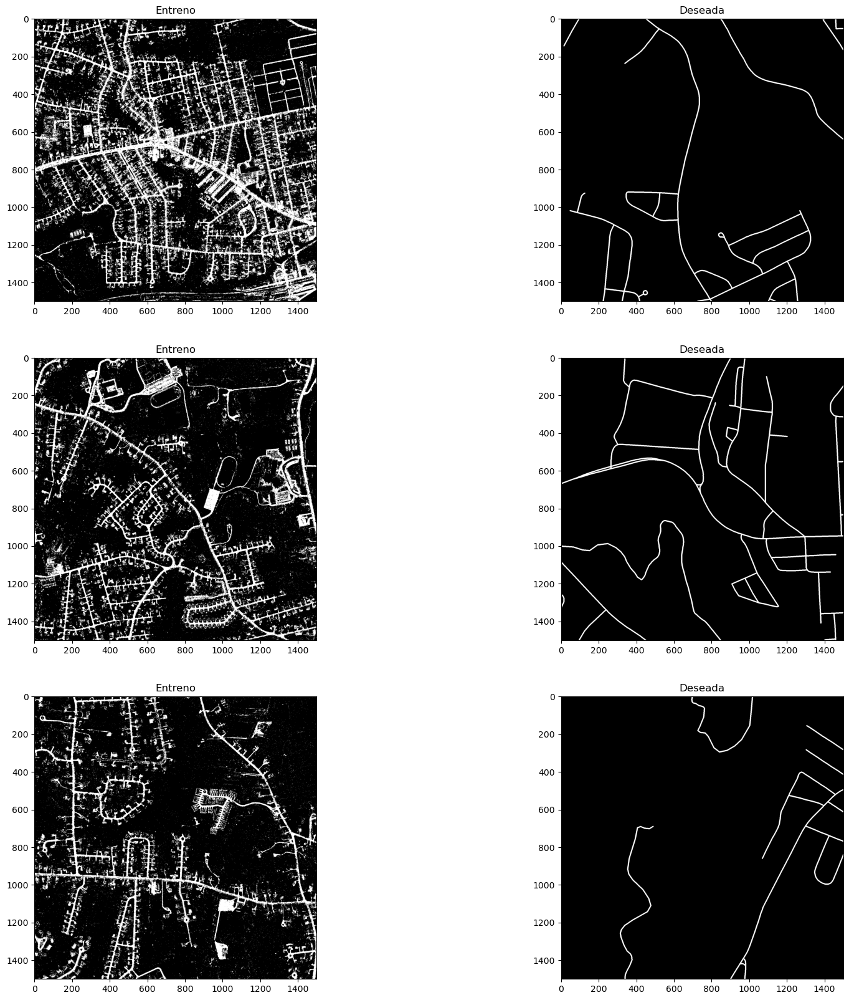

In [34]:
img1 = y_pred_prueba[0*(1500*1500) : 1*(1500*1500)]
img2 = y_pred_prueba[1*(1500*1500) : 2*(1500*1500)]
img3 = y_pred_prueba[2*(1500*1500) : 3*(1500*1500)]
print(f"Img1: {len(img1)}")
print(f"Img2: {len(img2)}")
print(f"Img3: {len(img3)}")


img1_r = np.reshape(img1, (1500, 1500))
img2_r = np.reshape(img2, (1500, 1500))
img3_r = np.reshape(img3, (1500, 1500))

plt.rcParams["figure.figsize"] = [20, 20]

plt.subplot(321, title='Entreno')
plt.imshow(img1_r, cmap='gray')
plt.subplot(322, title='Deseada')
plt.imshow(imgs_gt[3], cmap='gray')
plt.subplot(323, title='Entreno')
plt.imshow(img2_r, cmap='gray')
plt.subplot(324, title='Deseada')
plt.imshow(imgs_gt[4], cmap='gray')
plt.subplot(325, title='Entreno')
plt.imshow(img3_r, cmap='gray')
plt.subplot(326, title='Deseada')
plt.imshow(imgs_gt[5], cmap='gray')

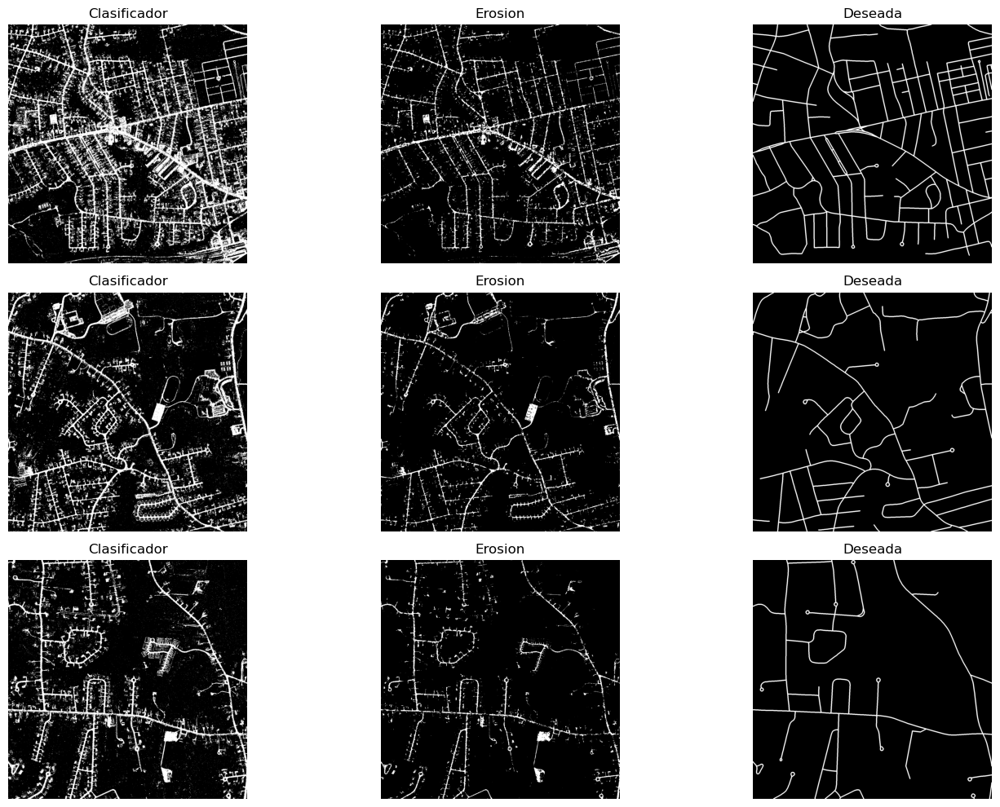

In [35]:
imagenes = [img1_r, img2_r, img3_r]
y_pred_erosiones = aplicar_erosion(imagenes, kernel_size=3)



# Reconstruir las imágenes erosionadas a partir de los valores aplanados
erosionadas = [y_pred_erosiones[i * img.size:(i + 1) * img.size].reshape(img.shape) for i, img in enumerate(imagenes)]

# Crear el plot
plt.figure(figsize=(15, 10))

# Imagen 1
plt.subplot(331, title='Clasificador')
plt.imshow(img1_r, cmap='gray')
plt.axis('off')

plt.subplot(332, title='Erosion')
plt.imshow(erosionadas[0], cmap='gray')
plt.axis('off')

plt.subplot(333, title='Deseada')
plt.imshow(imgs_gt[17], cmap='gray')
plt.axis('off')

# Imagen 2
plt.subplot(334, title='Clasificador')
plt.imshow(img2_r, cmap='gray')
plt.axis('off')

plt.subplot(335, title='Erosion')
plt.imshow(erosionadas[1], cmap='gray')
plt.axis('off')

plt.subplot(336, title='Deseada')
plt.imshow(imgs_gt[18], cmap='gray')
plt.axis('off')

# Imagen 3
plt.subplot(337, title='Clasificador')
plt.imshow(img3_r, cmap='gray')
plt.axis('off')

plt.subplot(338, title='Erosion')
plt.imshow(erosionadas[2], cmap='gray')
plt.axis('off')

plt.subplot(339, title='Deseada')
plt.imshow(imgs_gt[19], cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


In [54]:
### Accuracy:
accuracy3 = accuracy_score(bin_y_test, y_pred_prueba)
print(f"Erosion Accuracy Test: {accuracy3:.3f}")

### F1-Score:
f1c = f1_score(bin_y_test, y_pred_prueba)
print(f"Erosion F1 Score: {f1c:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_prueba)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_prueba)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.842
Erosion F1 Score: 0.376
Erosion Jaccard Test: 0.231
MCC: 0.397


In [55]:
### Accuracy:
accuracy3e = accuracy_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Accuracy Test: {accuracy3e:.3f}")

### F1-Score:
f1ce = f1_score(bin_y_test, y_pred_erosiones)
print(f"Erosion F1 Score: {f1ce:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_erosiones)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.938
Erosion F1 Score: 0.502
Erosion Jaccard Test: 0.335
MCC: 0.471


# Histogram of gradients

In [38]:
from skimage.feature import hog

X_train = pd.DataFrame()

for i in range(14):
    # Canales RGB
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()
    
    # Gradientes, HSV, Laplaciano, etc.
    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], 3)
    magnitud_road = calcular_magnitud(gradiente_road)
    orientacion_road = calcular_orientacion(gradiente_road)
    laplaciano_road = calcular_laplaciano(imgs_sat[i][:, :, 2], 3)
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()
    
    # HOG - Calculado sobre la componente V (luminosidad) del espacio HSV
    img_hog = road_hsv[:, :, 2]  # Componente V (escala de grises)
    hog_features, hog_image = hog(
        img_hog, 
        pixels_per_cell=(8, 8), 
        cells_per_block=(2, 2), 
        block_norm='L2-Hys', 
        visualize=True
    )
    
    # Ajustar HOG al tamaño de los píxeles mediante interpolación
    hog_resized = np.resize(hog_features, (img_hog.shape[0], img_hog.shape[1])).flatten()
    
    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()
    df_img["Mag"] = magnitud_road.flatten()
    df_img["Ori"] = orientacion_road.flatten()
    df_img["Lap"] = laplaciano_road.flatten()
    df_img["HOG"] = hog_resized  # Ahora HOG tiene el tamaño correcto
    
    # Concatenar con X_train
    X_train = pd.concat([X_train, df_img])

# Etiquetas de entrenamiento
y_train = [item for sublist in [imgs_gt[i].flatten() for i in range(14)] for item in sublist]
y_train = np.array(y_train)

print(f"Shape de X_train: {X_train.shape}")
print(f"Shape de y_train: {len(y_train)}")

# Validación
X_val = pd.DataFrame()

for i in range(14, 17):
    # Canales RGB
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()
    
    # Gradientes, HSV, Laplaciano, etc.
    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], 3)
    magnitud_road = calcular_magnitud(gradiente_road)
    orientacion_road = calcular_orientacion(gradiente_road)
    laplaciano_road = calcular_laplaciano(imgs_sat[i][:, :, 2], 3)
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()
    
    # HOG - Calculado sobre la componente V (luminosidad)
    img_hog = road_hsv[:, :, 2]  # Componente V
    hog_features, _ = hog(
        img_hog, 
        pixels_per_cell=(8, 8), 
        cells_per_block=(2, 2), 
        block_norm='L2-Hys', 
        visualize=True
    )
    
    # Ajustar HOG al tamaño de los píxeles
    hog_resized = np.resize(hog_features, (img_hog.shape[0], img_hog.shape[1])).flatten()
    
    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()
    df_img["Mag"] = magnitud_road.flatten()
    df_img["Ori"] = orientacion_road.flatten()
    df_img["Lap"] = laplaciano_road.flatten()
    df_img["HOG"] = hog_resized  # Asegurar tamaño correcto de HOG
    
    # Concatenar con X_val
    X_val = pd.concat([X_val, df_img])

# Etiquetas de validación
y_val = [item for sublist in [imgs_gt[i].flatten() for i in range(14, 17)] for item in sublist]
y_val = np.array(y_val)

print(f"Shape de X_val: {X_val.shape}")
print(f"Shape de y_val: {len(y_val)}")

# Test
X_test = pd.DataFrame()

for i in range(17, 20):
    # Canales RGB
    r = imgs_sat[i][:, :, 0].flatten()
    g = imgs_sat[i][:, :, 1].flatten()
    b = imgs_sat[i][:, :, 2].flatten()
    
    # Gradientes, HSV, Laplaciano, etc.
    gradiente_road = calcular_gradiente(imgs_sat[i][:, :, 2], 3)
    magnitud_road = calcular_magnitud(gradiente_road)
    orientacion_road = calcular_orientacion(gradiente_road)
    laplaciano_road = calcular_laplaciano(imgs_sat[i][:, :, 2], 3)
    road_hsv = sk.color.rgb2hsv(imgs_sat[i])
    hsv_1 = road_hsv[:, :, 0].flatten()
    hsv_2 = road_hsv[:, :, 1].flatten()
    hsv_3 = road_hsv[:, :, 2].flatten()
    
    # HOG - Calculado sobre la componente V (luminosidad)
    img_hog = road_hsv[:, :, 2]  # Componente V
    hog_features, _ = hog(
        img_hog, 
        pixels_per_cell=(8, 8), 
        cells_per_block=(2, 2), 
        block_norm='L2-Hys', 
        visualize=True
    )
    
    # Ajustar HOG al tamaño de los píxeles
    hog_resized = np.resize(hog_features, (img_hog.shape[0], img_hog.shape[1])).flatten()
    
    # Crear DataFrame para esta imagen
    df_img = pd.DataFrame()
    df_img["R"] = r
    df_img["G"] = g
    df_img["B"] = b
    df_img["H"] = hsv_1
    df_img["S"] = hsv_2
    df_img["V"] = hsv_3
    df_img["Grad_X"] = gradiente_road[0].flatten()
    df_img["Grad_Y"] = gradiente_road[1].flatten()
    df_img["Mag"] = magnitud_road.flatten()
    df_img["Ori"] = orientacion_road.flatten()
    df_img["Lap"] = laplaciano_road.flatten()
    df_img["HOG"] = hog_resized  # Asegurar tamaño correcto de HOG
    
    # Concatenar con X_test
    X_test = pd.concat([X_test, df_img])

# Etiquetas de test
y_test = [item for sublist in [imgs_gt[i].flatten() for i in range(17, 20)] for item in sublist]
y_test = np.array(y_test)

print(f"Shape de X_test: {X_test.shape}")
print(f"Shape de y_test: {len(y_test)}")



Shape de X_train: (31500000, 12)
Shape de y_train: 31500000
Shape de X_val: (6750000, 12)
Shape de y_val: 6750000
Shape de X_test: (6750000, 12)
Shape de y_test: 6750000


In [39]:
bin_y_train = y_train > 0
bin_y_val = y_val > 0
bin_y_test = y_test > 0

num_trues_train = sum(bin_y_train)
num_false_train = len(bin_y_train) - num_trues_train
ratio = int(num_false_train / num_trues_train)
print(f'ratio=',ratio)

dtrain = xgboost.DMatrix(X_train.values, label=bin_y_train)
dval = xgboost.DMatrix(X_val.values, label=bin_y_val)
dtest = xgboost.DMatrix(X_test.values) 


ratio= 30


In [40]:
param = {'max_depth':8, 'eta':1, 'objective':'binary:logistic', 'scale_pos_weight':ratio}
watchlist = [(dtrain, 'train'), (dval, 'val')]

In [41]:
model = xgboost.train(param, dtrain, 100, watchlist, early_stopping_rounds=10)

c:\Users\pdcob\anaconda3\Lib\site-packages\xgboost\core.py:723: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)


[0]	train-logloss:0.37806	val-logloss:0.39774
[1]	train-logloss:0.34801	val-logloss:0.37427
[2]	train-logloss:0.34163	val-logloss:0.37042
[3]	train-logloss:0.34000	val-logloss:0.36806
[4]	train-logloss:0.33957	val-logloss:0.36867
[5]	train-logloss:0.33826	val-logloss:0.36796
[6]	train-logloss:0.33619	val-logloss:0.36589
[7]	train-logloss:0.33525	val-logloss:0.36518
[8]	train-logloss:0.33552	val-logloss:0.36548
[9]	train-logloss:0.33503	val-logloss:0.36552
[10]	train-logloss:0.33415	val-logloss:0.36499
[11]	train-logloss:0.33380	val-logloss:0.36489
[12]	train-logloss:0.33332	val-logloss:0.36437
[13]	train-logloss:0.33280	val-logloss:0.36384
[14]	train-logloss:0.33255	val-logloss:0.36366
[15]	train-logloss:0.33164	val-logloss:0.36282
[16]	train-logloss:0.33145	val-logloss:0.36296
[17]	train-logloss:0.33118	val-logloss:0.36298
[18]	train-logloss:0.33074	val-logloss:0.36269
[19]	train-logloss:0.33064	val-logloss:0.36222
[20]	train-logloss:0.33030	val-logloss:0.36215
[21]	train-logloss:0.33

In [42]:
y_pred = model.predict(dtest)
y_pred_prueba = y_pred > 0.5

Img1: 2250000
Img2: 2250000
Img3: 2250000


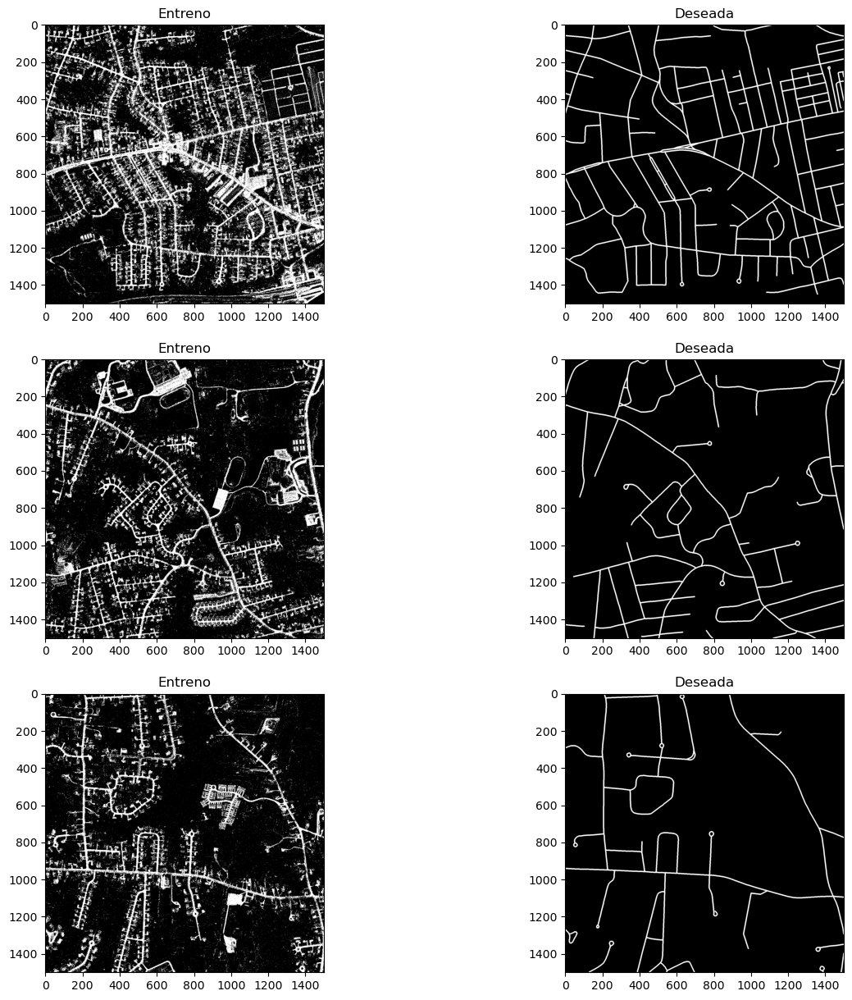

In [43]:
img1 = y_pred_prueba[0*(1500*1500) : 1*(1500*1500)]
img2 = y_pred_prueba[1*(1500*1500) : 2*(1500*1500)]
img3 = y_pred_prueba[2*(1500*1500) : 3*(1500*1500)]
print(f"Img1: {len(img1)}")
print(f"Img2: {len(img2)}")
print(f"Img3: {len(img3)}")


img1_r = np.reshape(img1, (1500, 1500))
img2_r = np.reshape(img2, (1500, 1500))
img3_r = np.reshape(img3, (1500, 1500))

plt.rcParams["figure.figsize"] = [15, 15]

plt.subplot(321, title='Entreno')
plt.imshow(img1_r, cmap='gray')
plt.subplot(322, title='Deseada')
plt.imshow(imgs_gt[17], cmap='gray')
plt.subplot(323, title='Entreno')
plt.imshow(img2_r, cmap='gray')
plt.subplot(324, title='Deseada')
plt.imshow(imgs_gt[18], cmap='gray')
plt.subplot(325, title='Entreno')
plt.imshow(img3_r, cmap='gray')
plt.subplot(326, title='Deseada')
plt.imshow(imgs_gt[19], cmap='gray')

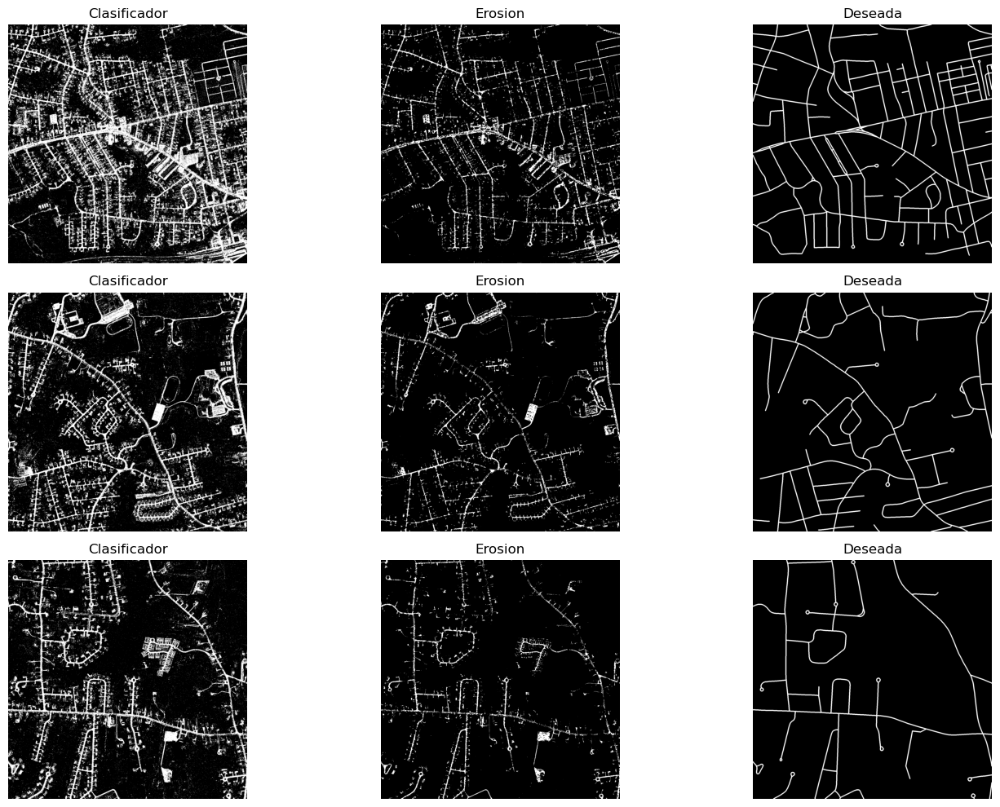

In [44]:
imagenes = [img1_r, img2_r, img3_r]
y_pred_erosiones = aplicar_erosion(imagenes, kernel_size=3)



# Reconstruir las imágenes erosionadas a partir de los valores aplanados
erosionadas = [y_pred_erosiones[i * img.size:(i + 1) * img.size].reshape(img.shape) for i, img in enumerate(imagenes)]

# Crear el plot
plt.figure(figsize=(15, 10))

# Imagen 1
plt.subplot(331, title='Clasificador')
plt.imshow(img1_r, cmap='gray')
plt.axis('off')

plt.subplot(332, title='Erosion')
plt.imshow(erosionadas[0], cmap='gray')
plt.axis('off')

plt.subplot(333, title='Deseada')
plt.imshow(imgs_gt[17], cmap='gray')
plt.axis('off')

# Imagen 2
plt.subplot(334, title='Clasificador')
plt.imshow(img2_r, cmap='gray')
plt.axis('off')

plt.subplot(335, title='Erosion')
plt.imshow(erosionadas[1], cmap='gray')
plt.axis('off')

plt.subplot(336, title='Deseada')
plt.imshow(imgs_gt[18], cmap='gray')
plt.axis('off')

# Imagen 3
plt.subplot(337, title='Clasificador')
plt.imshow(img3_r, cmap='gray')
plt.axis('off')

plt.subplot(338, title='Erosion')
plt.imshow(erosionadas[2], cmap='gray')
plt.axis('off')

plt.subplot(339, title='Deseada')
plt.imshow(imgs_gt[19], cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


In [56]:
### Accuracy:
accuracy4 = accuracy_score(bin_y_test, y_pred_prueba)
print(f"Erosion Accuracy Test: {accuracy4:.3f}")

### F1-Score:
f1d = f1_score(bin_y_test, y_pred_prueba)
print(f"Erosion F1 Score: {f1d:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_prueba)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_prueba)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.842
Erosion F1 Score: 0.376
Erosion Jaccard Test: 0.231
MCC: 0.397


In [57]:
### Accuracy:
accuracy4e = accuracy_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Accuracy Test: {accuracy4e:.3f}")

### F1-Score:
f1de = f1_score(bin_y_test, y_pred_erosiones)
print(f"Erosion F1 Score: {f1de:.3f}")

### Jaccard:
jaccard = jaccard_score(bin_y_test, y_pred_erosiones)
print(f"Erosion Jaccard Test: {jaccard:.3f}")

### MCC (Matthews Correlation Coefficient)
mcc = matthews_corrcoef(bin_y_test, y_pred_erosiones)
print(f"MCC: {mcc:.3f}")


Erosion Accuracy Test: 0.938
Erosion F1 Score: 0.502
Erosion Jaccard Test: 0.335
MCC: 0.471
